# \*\*\[GODE\]\*\*Package Tutorial

SEOYEON CHOI  
2023-11-27

# Import

In [1]:
import GODE

2023-11-29 10:54:06.789011: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.

In [2]:
import numpy as np
import pandas as pd

In [3]:
from pygsp import graphs, filters, plotting, utils

# Linear

## Data_Linear

In [4]:
np.random.seed(6)
epsilon = np.around(np.random.normal(size=1000),15)
signal = np.random.choice(np.concatenate((np.random.uniform(-7, -5, 25).round(15), np.random.uniform(5, 7, 25).round(15), np.repeat(0, 950))), 1000)
eta = signal + epsilon

outlier_true_linear= signal.copy()
outlier_true_linear = list(map(lambda x: 1 if x!=0 else 0,outlier_true_linear))
index_of_trueoutlier_bool = signal!=0

In [5]:
x_1 = np.linspace(0,2,1000)
y1_1 = 5 * x_1
y_1 = y1_1 + eta # eta = signal + epsilon
_df=pd.DataFrame({'x':x_1, 'y':y_1})

## GODE_Lienar

In [6]:
Lin = GODE.Linear(_df)

In [7]:
Lin.fit(sd=20)

In [8]:
outlier_old_linear, outlier_linear, outlier_index_linear = GODE.GODE_Anomalous(Lin(_df),contamination=0.05)

## Plot_Linear

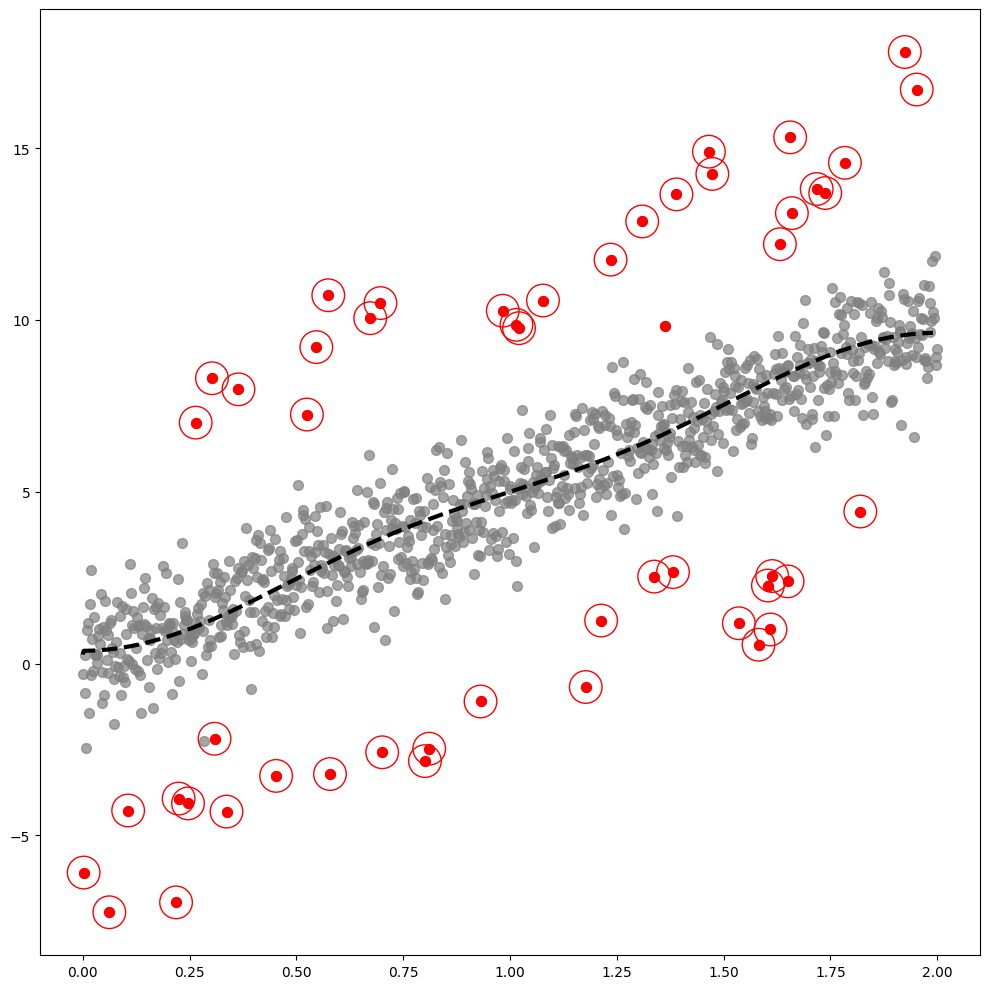

In [9]:
GODE.Linear_plot(Lin(_df),index_of_trueoutlier_bool, outlier_index_linear)

In [10]:
Lin(_df)['x'][:10]

In [11]:
Lin(_df)['y'][:10]

In [12]:
Lin(_df)['yhat'][:10]

## Confusion matrix_Linear

In [13]:
Conf_linear = GODE.Conf_matrx(outlier_true_linear,outlier_linear)

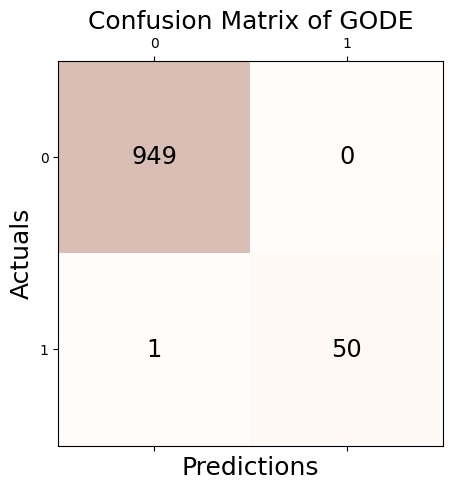

Accuracy: 0.999
Precision: 1.000
Recall: 0.980
F1 Score: 0.990

In [14]:
Conf_linear.conf('GODE')

In [15]:
Conf_linear()

------------------------------------------------------------------------

# Orbit

## Data_Orbit

In [16]:
np.random.seed(777)
epsilon = np.around(np.random.normal(size=1000),15)
signal = np.random.choice(np.concatenate((np.random.uniform(-4, -1, 25).round(15), np.random.uniform(1, 4, 25).round(15), np.repeat(0, 950))), 1000)
eta = signal + epsilon
pi=np.pi
n=1000
ang=np.linspace(-pi,pi-2*pi/n,n)
r=5+np.cos(np.linspace(0,12*pi,n))
vx=r*np.cos(ang)
vy=r*np.sin(ang)
f1=10*np.sin(np.linspace(0,6*pi,n))
f = f1 + eta
_df = pd.DataFrame({'x' : vx, 'y' : vy, 'f1':f1, 'f' : f})
outlier_true_orbit = signal.copy()
outlier_true_orbit = list(map(lambda x: 1 if x!=0 else 0,outlier_true_orbit))
index_of_trueoutlier_bool = signal!=0

## GODE_Orbit

In [17]:
Or = GODE.Orbit(_df)

In [18]:
Or.fit(sd=15)

100%|██████████| 1000/1000 [00:01<00:00, 576.96it/s]

In [19]:
outlier_old_orbit, outlier_orbit, outlier_index_orbit = GODE.GODE_Anomalous(Or(_df),contamination=0.05)

## Plot_Orbit

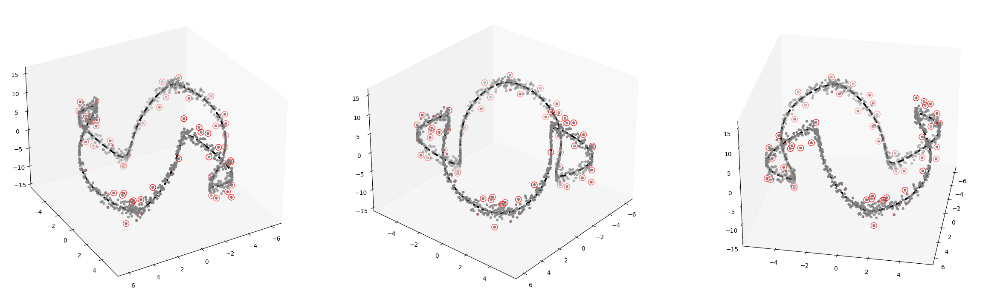

In [20]:
GODE.Orbit_plot(Or(_df),index_of_trueoutlier_bool,outlier_index_orbit)

In [21]:
Or(_df)['x'][:5]

In [22]:
Or(_df)['y'][:5]

In [23]:
Or(_df)['f1'][:5]

In [24]:
Or(_df)['f'][:5]

In [25]:
Or(_df)['fhat'][:5]

## Confusion matrix_Orbit

In [26]:
Conf_orbit = GODE.Conf_matrx(outlier_true_orbit,outlier_orbit)

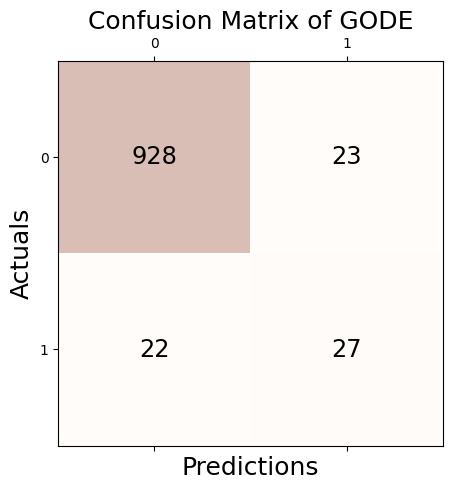

Accuracy: 0.955
Precision: 0.540
Recall: 0.551
F1 Score: 0.545

In [27]:
Conf_orbit.conf('GODE')

In [28]:
Conf_orbit()

------------------------------------------------------------------------

# Bunny

## Data_Bunny

In [29]:
G = graphs.Bunny()
n = G.N
g = filters.Heat(G, tau=75) 
n=2503
np.random.seed(1212)
normal = np.around(np.random.normal(size=n),15)
unif = np.concatenate([np.random.uniform(low=3,high=7,size=60), np.random.uniform(low=-7,high=-3,size=60),np.zeros(n-120)]); np.random.shuffle(unif)
noise = normal + unif
f = np.zeros(n)
f[1000] = -3234
f = g.filter(f, method='chebyshev') 
outlier_true_bunny = unif.copy()
outlier_true_bunny = list(map(lambda x: 1 if x !=0  else 0,outlier_true_bunny))

2023-11-29 10:54:13,011:[WARNING](pygsp.graphs.graph.lmax): The largest eigenvalue G.lmax is not available, we need to estimate it. Explicitly call G.estimate_lmax() or G.compute_fourier_basis() once beforehand to suppress the warning.

In [30]:
G.coords.shape
_W = G.W.toarray()
_x = G.coords[:,0]
_y = G.coords[:,1]
_z = -G.coords[:,2]
_df = pd.DataFrame({'x':_x,'y':_y,'z':_z, 'f1' : f, 'f':f+noise,'noise': noise})

## GODE_Bunny

In [31]:
bu = GODE.BUNNY(_df,_W)

In [32]:
bu.fit(sd=20)

In [33]:
outlier_old_bunny, outlier_bunny, outlier_index_bunny = GODE.GODE_Anomalous(bu(_df),contamination=0.05)

## Plot_Bunny

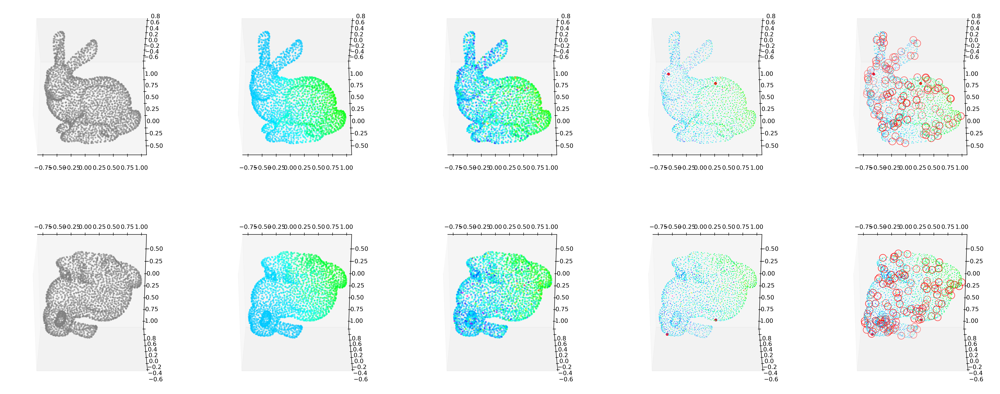

In [34]:
GODE.Bunny_plot(bu(_df),outlier_true_bunny,outlier_index_bunny)

In [35]:
bu(_df)

## Confusion matrix_Bunny

In [36]:
Conf_bunny = GODE.Conf_matrx(outlier_true_bunny,outlier_bunny)

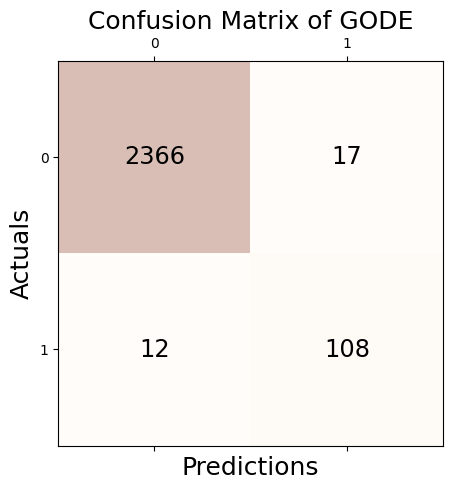

Accuracy: 0.988
Precision: 0.864
Recall: 0.900
F1 Score: 0.882

In [37]:
Conf_bunny.conf('GODE')

In [38]:
Conf_bunny()